In [1]:

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from torchvision.transforms import Normalize
from torchvision.datasets import DatasetFolder
import torchvision.datasets as datasets
import torch.utils.data as data
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os

In [24]:
!pip install captum --upgrade


In [34]:
from pathlib import Path
import pydicom
import cv2
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import torch.utils.data as data
import pandas as pd
import torch
import torchvision
from torchvision import transforms
import torchmetrics
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning.loggers import TensorBoardLogger
from tqdm.notebook import tqdm
import numpy as np
import matplotlib.pyplot as plt
import captum
from captum.attr import configure_interpretable_embedding_layer, remove_interpretable_embedding_layer



In [3]:
labels = pd.read_csv("/Users/jiashuoli/Documents/GitHub/rsna-pneumonia-detection-challenge/stage_2_train_labels.csv")
labels

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1
...,...,...,...,...,...,...
30222,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,185.0,298.0,228.0,379.0,1
30223,c1edf42b-5958-47ff-a1e7-4f23d99583ba,NaN,NaN,NaN,NaN,0
30224,c1f6b555-2eb1-4231-98f6-50a963976431,NaN,NaN,NaN,NaN,0
30225,c1f7889a-9ea9-4acb-b64c-b737c929599a,570.0,393.0,261.0,345.0,1


In [4]:
labels = labels.drop_duplicates("patientId")
labels

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1
...,...,...,...,...,...,...
30219,c1e73a4e-7afe-4ec5-8af6-ce8315d7a2f2,666.0,418.0,186.0,223.0,1
30221,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,609.0,464.0,240.0,284.0,1
30223,c1edf42b-5958-47ff-a1e7-4f23d99583ba,NaN,NaN,NaN,NaN,0
30224,c1f6b555-2eb1-4231-98f6-50a963976431,NaN,NaN,NaN,NaN,0


In [5]:
ROOT_PATH = Path("/Users/jiashuoli/Documents/GitHub/rsna-pneumonia-detection-challenge/stage_2_train_images")
SAVE_PATH = Path('/Users/jiashuoli/Documents/GitHub/rsna-pneumonia-detection-challenge/processed')

In [6]:
train_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(0.49, 0.248),
    transforms.RandomAffine(degrees=(-5, 5), translate=(0, 0.05), scale=(0.9, 1.1)),
    transforms.RandomResizedCrop((224, 224), scale=(0.35, 1))
])

val_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(0.49, 0.248),
    transforms.RandomResizedCrop((224, 224), scale=(0.35, 1))
])

In [7]:
def load_file(path):
    return np.load(path).astype(np.float32)

In [8]:
train_dataset = torchvision.datasets.DatasetFolder(SAVE_PATH/"train/", loader=load_file, extensions="npy", transform=train_transforms)
val_dataset = torchvision.datasets.DatasetFolder(SAVE_PATH/"val/", loader=load_file, extensions="npy", transform=val_transforms)

In [9]:
val_dataset

Dataset DatasetFolder
    Number of datapoints: 2684
    Root location: /Users/jiashuoli/Documents/GitHub/rsna-pneumonia-detection-challenge/processed/val
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=0.49, std=0.248)
               RandomResizedCrop(size=(224, 224), scale=(0.35, 1), ratio=(0.75, 1.3333), interpolation=bilinear), antialias=None)
           )

In [10]:
batch_size=1
num_workers = 4

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size,num_workers=0, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size,num_workers=0, shuffle=True)

In [11]:
class PneumoniaModel(pl.LightningModule):
    
    def __init__(self):
        super(PneumoniaModel, self).__init__()
        self.model = torchvision.models.resnet18()
        self.model.conv1 = torch.nn.Conv2d(1, 64, kernel_size=(7,7), stride=(2,2), padding=(3,3), bias=False)
        self.model.fc=torch.nn.Linear(in_features=512, out_features=2, bias=True)
        
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=1e-4)
        self.loss_fn = torch.nn.BCEWithLogitsLoss(pos_weight=torch.tensor([3]))
        
        self.train_acc = torchmetrics.classification.BinaryAccuracy()
        self.val_acc = torchmetrics.classification.BinaryAccuracy()
        
    def forward(self, data):
        pred = self.model(data)
        return pred

In [140]:
class PnemoniaModel(pl.LightningModule):
    def __init__(self):
        super().__init__()
        self.model = torchvision.models.resnet18()
        self.model.conv1 = torch.nn.Conv2d(1, 64, kernel_size=(7,7), stride=(2,2), padding=(3,3), bias= False)
        self.model.fc = torch.nn.Linear(in_features=512, out_features=2)
        
        self.feature_map = torch.nn.Sequential(*list(self.model.children())[:-2])
        

        
        
    def forward(self, data):
        feature_map = self.feature_map(data)
        avg_pool_output = torch.nn.functional.adaptive_avg_pool2d(input=feature_map, output_size=(1,1))
        avg_output_flattened = torch.flatten(avg_pool_output)
        pred = self.model.fc(avg_output_flattened)
        return pred, feature_map

In [12]:
model = PneumoniaModel.load_from_checkpoint("weights/weights_1.ckpt", strict=False)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
model.eval()
model.to(device)

cpu


PneumoniaModel(
  (model): ResNet(
    (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, trac

In [13]:
from captum.attr import (
    FeaturePermutation,
    GradientShap,
    LayerGradCam,
    Occlusion,
    IntegratedGradients,
    GuidedGradCam,
    Saliency,
    Deconvolution,
    GuidedBackprop,
    LRP,
    DeepLift
)

In [36]:
saliency = Saliency(model)
layergradcam = LayerGradCam(model,model.model.conv1)
lrp = LRP(model)
occlusion = Occlusion(model)
integratedGradients = IntegratedGradients(model)

In [37]:
# Define the draw_attributes function
def draw_attributes(img, attribution):
    # Normalize the attribution map
    attribution = np.maximum(0, attribution) / np.max(attribution)
    # Convert the image and attribution map to a grayscale colormap
    cmap = plt.get_cmap("gray")
    # Combine the image and attribution map
    attr_image = np.uint8(cmap(attribution)[:,:,:3] * 255)
    attr_image = cv2.resize(attr_image, (img.shape[2], img.shape[1]))
    attr_image = np.float32(attr_image) / 255
    attr_image = np.uint8(attr_image * 255)
    combined = cv2.addWeighted(np.uint8(img * 255), 0.5, attr_image, 0.5, 0)

    # Show the result
    fig, ax = plt.subplots(1, 3, figsize=(12, 6))
    ax[0].imshow(np.uint8(img * 255))
    ax[0].axis('off')
    ax[1].imshow(attribution, cmap='gray')
    ax[1].axis('off')
    ax[2].imshow(combined)
    ax[2].axis('off')
    plt.show()

torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])


/opt/homebrew/anaconda3/lib/python3.9/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(


torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([1])


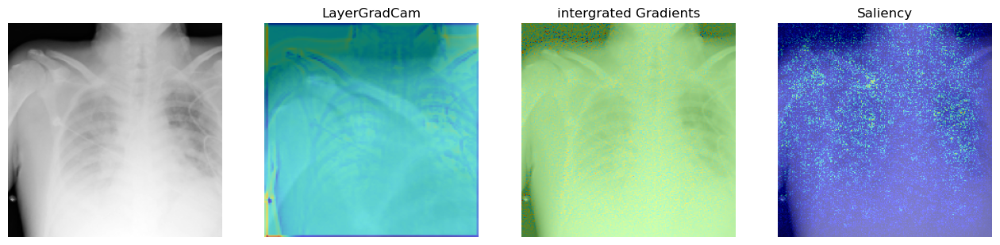

torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([1])


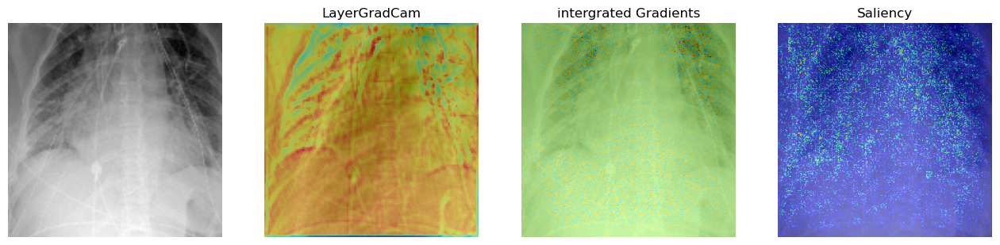

torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([1])


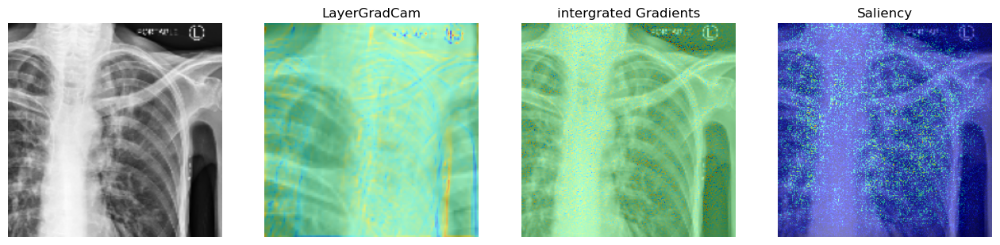

torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([1])


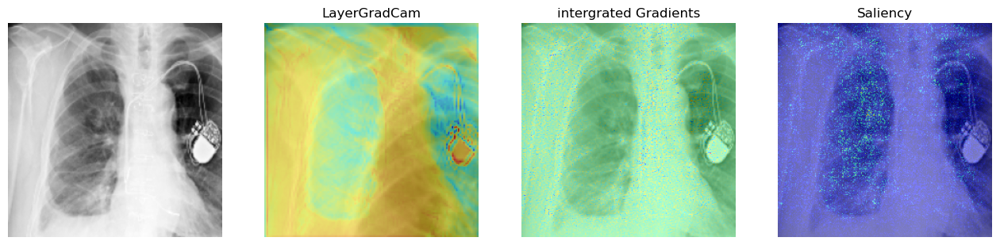

torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([1])


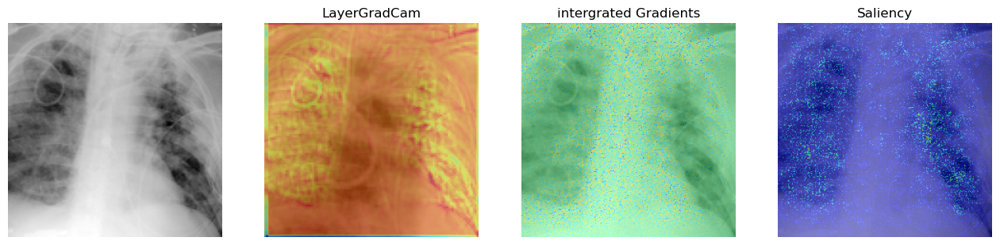

torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([1])


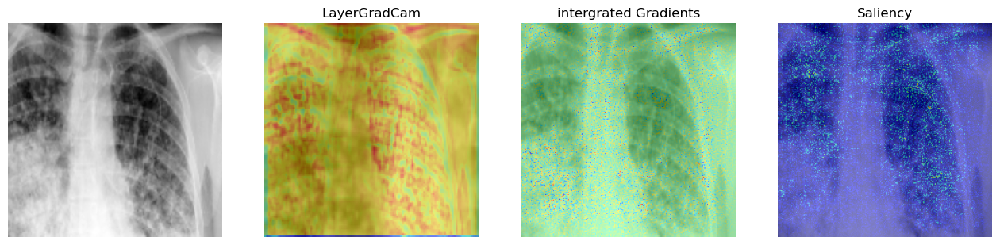

torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([1])


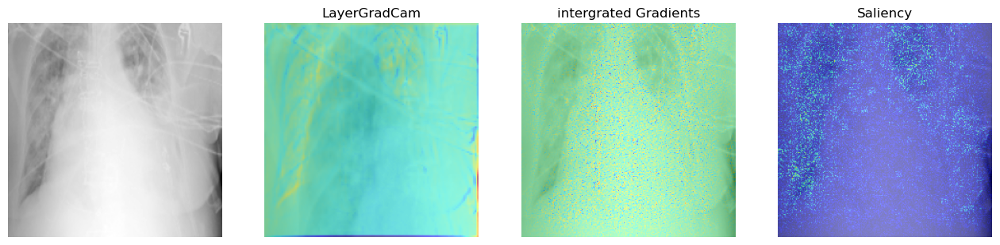

torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([1])


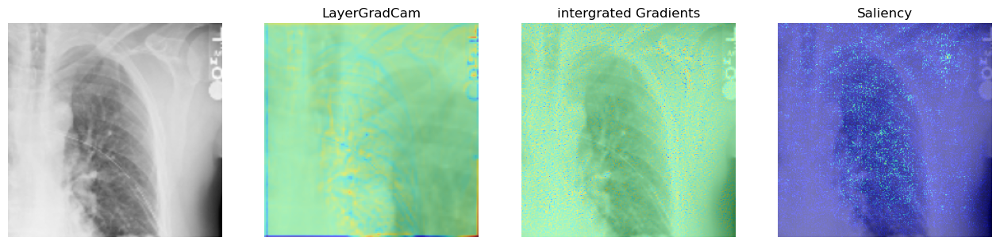

torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([1])


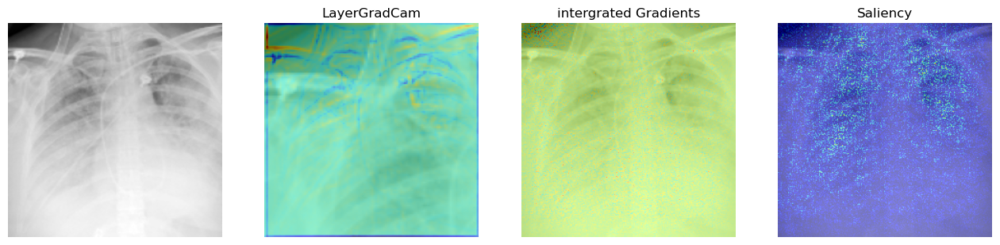

torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor(

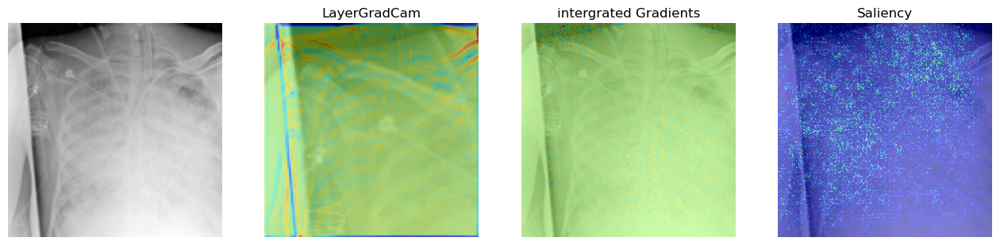

torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([1])


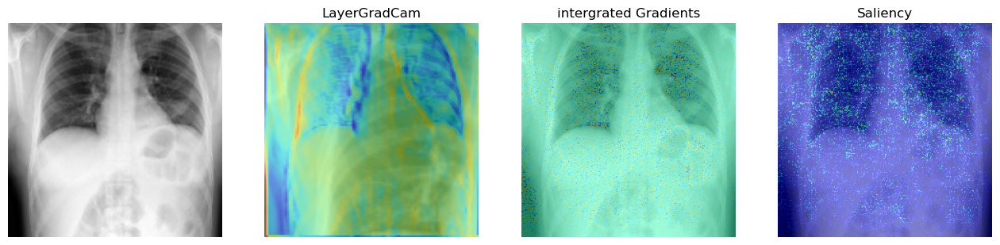

torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([1])


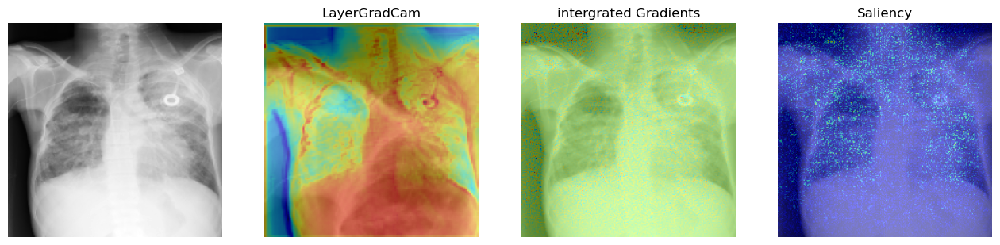

torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([1])


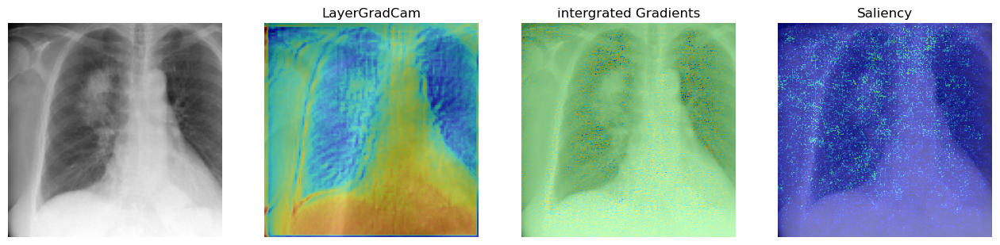

torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([1])


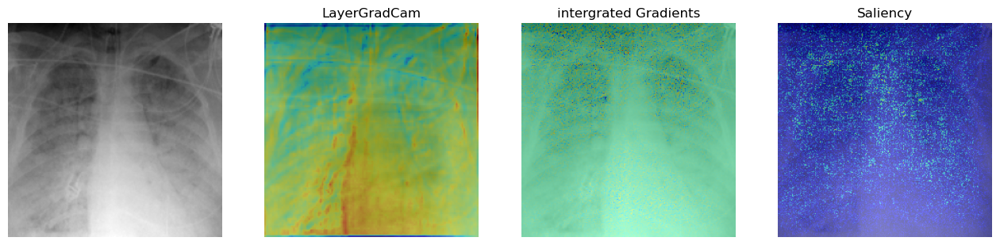

torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([1])


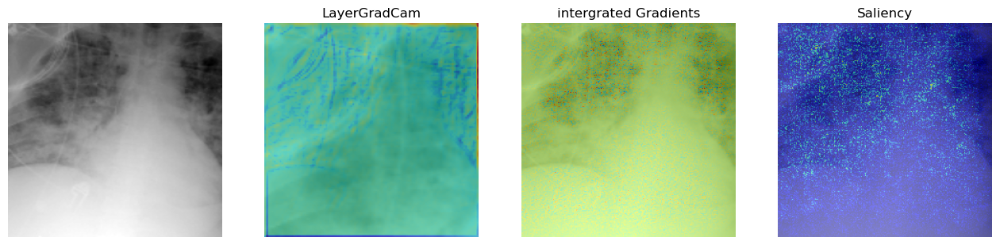

torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([1])


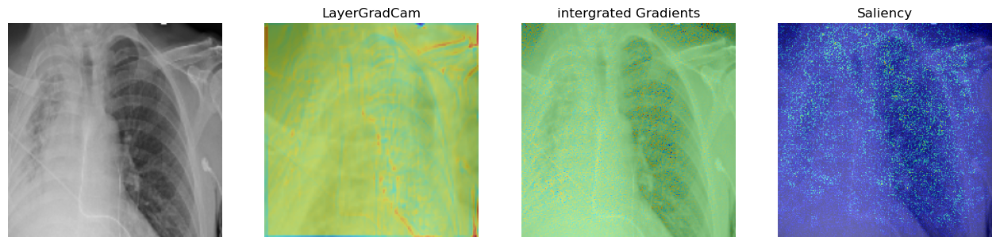

torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([1])


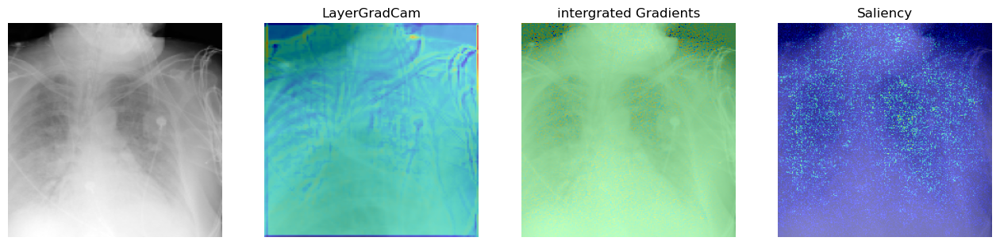

torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([1])


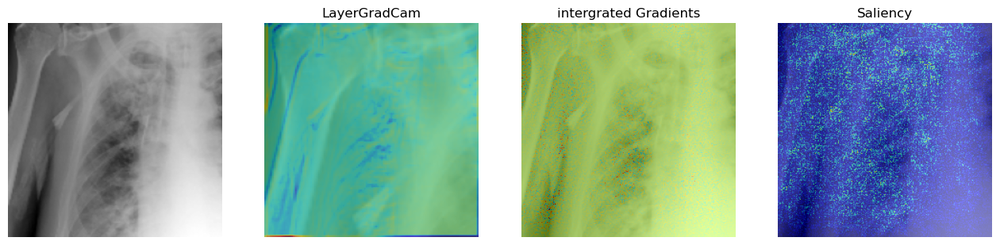

torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([0])
torch.Size([1, 1, 224, 224])
torch.Size([1, 224, 224])
tensor([1])


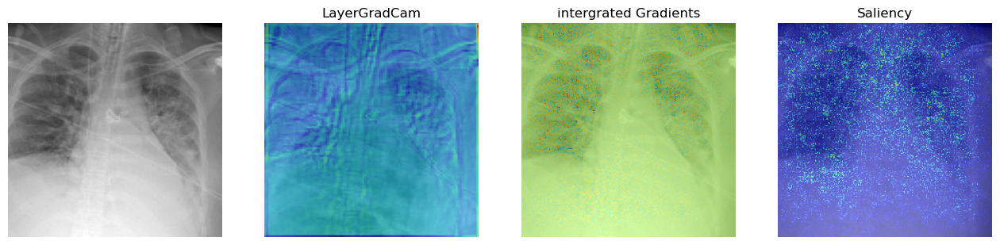

In [39]:
sal_attributions = []
lay_attributions = []
lrp_attributions = []
occ_attributions = []
inter_attributions = []
imgs = []
labels = []
flag = 1

# Initialize the LayerGradCam algorithm
layer_grad_cam = LayerGradCam(model, model.model.conv1)

# Loop through the validation set and compute the attribution maps
for images, labels in val_loader:
    # Compute the attribution maps using LayerGradCam
    target_class = labels  # Use ground truth label as the target class
    # target_class.any()

    print(images.shape)
    print(images[0].shape)
    print(labels)

    
    # Compute the model's predictions
    predictions = model(images)
    predicted_labels = torch.argmax(predictions, dim=1).detach().cpu().numpy()
  
    # Compute the attribution maps using LayerGradCam
    
    sal_attribution = saliency.attribute(images, target=target_class)
    inter_attribution = integratedGradients.attribute(images, target=target_class)
    attribution_maps = layer_grad_cam.attribute(images, target=target_class)
    
    # occ_attribution = occlusion.attribute(img, target=label)
    # occ_attributions.append(occ_attribution)
    
    # Append the attribution maps to the list
    sal_attributions.append(sal_attribution)
    inter_attributions.append(inter_attribution) 
    lay_attributions.append(attribution_maps)
    
    # Draw the attribution maps for each image in the batch
  # Draw the attribution maps for each image in the batch
    for i in range(images.shape[0]):
        image = images[i].squeeze().numpy()
        attribution_map = attribution_maps[i].squeeze().detach().numpy()
        inter_map = inter_attribution[i].squeeze().detach().numpy()
        sal_map = sal_attribution[i].squeeze().detach().numpy()
        predicted_label = predicted_labels[i]
        ground_truth_label = labels[i]
        if ground_truth_label == 1:
            # Normalize the attribution maps to [0, 1]
            flag += 1 
            attribution_map = (attribution_map - attribution_map.min()) / (attribution_map.max() - attribution_map.min())
            inter_map = (inter_map - inter_map.min()) / (inter_map.max() - inter_map.min())
            sal_map = (sal_map - sal_map.min()) / (sal_map.max() - sal_map.min())
            
            # Plot the image and attribution maps side by side
            fig, axs = plt.subplots(1, 4, figsize=(16, 4))
            axs[0].imshow(image, cmap='gray')
            axs[0].axis('off')
            axs[1].imshow(image, cmap='gray')
            axs[1].imshow(attribution_map, cmap='jet', alpha=0.5)
            axs[1].set_title('LayerGradCam')
            axs[1].axis('off')
            axs[2].imshow(image, cmap='gray')
            axs[2].imshow(inter_map, cmap='jet', alpha=0.5)
            axs[2].set_title('intergrated Gradients')
            axs[2].axis('off')
            axs[3].imshow(image, cmap='gray')
            axs[3].imshow(sal_map, cmap='jet', alpha=0.5)
            axs[3].set_title('Saliency')
            axs[3].axis('off')
            plt.show()
    if flag == 20:
        break


In [ ]:
sal_attributions = []
lay_attributions = []
lrp_attributions = []
occ_attributions = []
imgs = []
labels = []
flag = 0
# Initialize the LayerGradCam algorithm
layer_grad_cam = LayerGradCam(model, model.model.conv1)

# Loop through the validation set and compute the attribution maps
for images, labels in val_loader:
    
    print(labels.shape)
    print(images.shape)

    # Compute the attribution maps using LayerGradCam
    target_class = labels  # Use ground truth label as the target class
    # print(images.shape)
    # print(images[0].shape)
    
    # occ_attribution = occlusion.attribute(images, target=target_class,sliding_window_shapes=tuple([1,2,2]))
    # occ_attributions.append(occ_attribution)
    attribution_maps = layer_grad_cam.attribute(images, target=target_class)
    print(attribution_maps.shape)

    # Append the attribution maps to the list
    lay_attributions.append(attribution_maps)
    
    # Draw the attribution maps for the first image in the batch
    for i in range(images.shape[0]):
        # Get the i-th image and attribution map from the batches
        image = images[i].squeeze().numpy()
        attribution_map = attribution_maps[i].squeeze().detach().numpy()
        
        # Normalize the attribution map to [0, 1]
        attribution_map = (attribution_map - attribution_map.min()) / (attribution_map.max() - attribution_map.min())
        
        # Plot the image and attribution map side by side
        fig, axs = plt.subplots(1, 2, figsize=(8, 4))
        axs[0].imshow(image, cmap='gray')
        axs[0].axis('off')
        axs[1].imshow(image, cmap='gray')
        axs[1].imshow(attribution_map, cmap='jet', alpha=0.5)
        axs[1].axis('off')
        plt.show()


    